In [80]:
import pandas as pd
import numpy as np
import os
import collections
from collections import Counter
import matplotlib.pyplot as plt

from datetime import timedelta
from datetime import date


import seaborn as sns

pd.set_option('display.max_columns', None)

## 1. Calculate the statistic of each record

### Read traffic flow data of each site - 974 sites

In [13]:
def read_df(filename):
    site_df = pd.read_csv(filename)
    
    return site_df

In [3]:
def read_df_2(site_df):
    site_dup = site_df.loc[site_df['count'] > 1]
    site_dup['startDate'] = min(site_df['lastUpdate'])
    site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
    site_dup['allCount'] = site_df['count'].sum()
       
    return site_dup

### Extract the essential information from raw traffic flow data 

In [4]:
def df_clean(site_dup):
    #clean and rearrange df
    new_cols = ['siteSiteid', 'timestamp', 'count', 'errorPercentage(%)', 'startDate']
    site_clean = site_dup[new_cols]

    #extract a date column from timestamp
    timestamp = site_clean['timestamp'].str.split('T', n = 1, expand = True)
    site_clean['date'] = timestamp[0]
    site_clean['time'] = timestamp[1]
    
    timestamp_raw = site_df['timestamp'].str.split('T', n = 1, expand = True)
    site_df['date'] = timestamp_raw[0]
    #display(site_df)
    
    return site_clean

### Get number of consecutive interpolation each day

In [5]:
def get_count_each_day(site_clean):
    #set date & add count
    dates = list(set(list(site_clean['date'])))
    #print(len(dates))

    site_dateCount = {}
    for a in dates:
        b = site_clean.loc[site_clean.date == a , 'count']
        c = site_df.loc[site_df.date == a, 'count']
        site_dateCount[a] = [sum(b), sum(c)]
    #print(site_dateCount)

    dic_site_dateCount = {}
    date = []
    dateCount = []
    dateCountAll = []
    for key, value in site_dateCount.items():
        date.append(key)
        dateCount.append(value[0])
        dateCountAll.append(value[1])
        

    dic_site_dateCount['errorDate'] = date
    dic_site_dateCount['reCount/Day'] = dateCount
    dic_site_dateCount['allCount/Day'] = dateCountAll

    df_site_dateCount = pd.DataFrame.from_dict(dic_site_dateCount)
    df_site_dateCount = df_site_dateCount.sort_values(by=['errorDate'])
    
    return df_site_dateCount

### Get the time of interpolation each day

In [6]:
def get_alltime_each_day(site_clean):
    #set date & merge time
    dates = list(set(list(site_clean['date'])))
    #print(len(dates))

    site_time = {}
    for a in dates:
        b = site_clean.loc[site_clean.date == a , 'time']
        site_time[a] = sorted(list(set(list(b))))
    #print(site_time)

    dic_site_time = {}
    date = []
    time = []
    for key, value in site_time.items():
        date.append(key)
        time.append(value)

    dic_site_time['errorDate'] = date
    dic_site_time['reTime/Day'] = time

    df_site_time = pd.DataFrame.from_dict(dic_site_time)
    df_site_time = df_site_time.sort_values(by=['errorDate'])
    
    return df_site_time

### Merge the two columns together

In [7]:
def merge_to_each_day(df_site_dateCount, df_site_time):
    site_date_time = pd.merge(df_site_dateCount, df_site_time, how="left", on=["errorDate"])
    site_date_time['siteId'] = site_clean['siteSiteid'].tolist()[0]
    site_date_time['errorPercentage(%)'] = site_dup['errorPercentage(%)'].tolist()[0]
    site_date_time['startDate'] = site_dup['startDate'].tolist()[0]
    site_date_time['errorPercentage/Day(%)'] = (site_date_time['reCount/Day'] - 1) / site_date_time['allCount/Day'] * 100
    site_date_time['allCount'] = site_dup['allCount'].tolist()[0]
    new_cols = ['siteId', 'errorDate', 'reCount/Day', 'reTime/Day', 'errorPercentage/Day(%)', 'errorPercentage(%)', 'allCount', 'startDate']
    site_date_time = site_date_time[new_cols]
    
    return site_date_time

### Merge each site in a single raw

In [8]:
def merge_to_each_site(site_date_time):
    # columns: siteId, errorPercentage, countAll, startDate
    site_id = site_date_time['siteId'].tolist()[0]
    error_percentage = site_date_time['errorPercentage(%)'].tolist()[0]
    count_all = site_date_time['allCount'].tolist()[0]
    start_date = site_date_time['startDate'].tolist()[0]
    
    data = [[site_id, error_percentage, count_all, start_date]]
    
    # Create the pandas DataFrame
    each_site = pd.DataFrame(data, columns = ['siteId', 'errorPercentage(%)', 'countAll', 'startDate'])
    
    return each_site

## Implement

Get the list of 530 sites

In [11]:
sites_530 = pd.read_csv('../20211028_SCOOT_Data/JupyterNotebook_CSV/useful_detector_530.csv')
sites_list = list(sites_530['siteId'])
print(len(set(sites_list)))

530


In [16]:
all_sites = []
all_sites_date = []
for site in sites_list:
    filename = 'SCOOT/data/'+ site + '&2021_12_13-2023_09_30.csv'
        
    site_df = read_df(filename)
    site_dup = read_df_2(site_df)
    site_clean = df_clean(site_dup)
    df_site_dateCount = get_count_each_day(site_clean)
    df_site_time = get_alltime_each_day(site_clean)
    site_date_time = merge_to_each_day(df_site_dateCount, df_site_time)

    #site_date_time.to_csv('SCOOT_data_statistic/Each_site_statistic/' + filename, index = False)       
    each_site = merge_to_each_site(site_date_time)

    all_sites.append(each_site)
    all_sites_date.append(site_date_time)


all_statistic = pd.concat(all_sites)
all_statistic = all_statistic.reset_index(drop=True)

all_sites_day_statistic = pd.concat(all_sites_date)
all_sites_day_statistic = all_sites_day_statistic.reset_index(drop=True)

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['startDate'] = min(site_df['lastUpdate'])
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  site_dup['errorPercentage(%)'] = (site_dup['count'].sum() - len(site_dup))/site_df['count'].sum() * 100
C:\Users\Amanda\AppData\Local\Temp\ipykernel_17324\2038569602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a cop

## 2. Clean the records via statistics

### Get counts 

In [17]:
counts = list(set(list(all_statistic['countAll'])))
#print(len(counts))

counts_sta = {}
for a in counts:
    b = all_statistic.loc[all_statistic.countAll == a , 'countAll']
    c = all_statistic.loc[all_statistic.countAll == a , 'siteId']
    counts_sta[a] = [len(b), list(c)]

collections.OrderedDict(sorted(counts_sta.items()))

dic_counts = {}
counts = []
countNumber = []
sites = []
for key, value in counts_sta.items():
    counts.append(key)
    countNumber.append(value[0])
    sites.append(value[1])


dic_counts['countAll'] = counts
dic_counts['countNum'] = countNumber
dic_counts['sites'] = sites

df_counts = pd.DataFrame.from_dict(dic_counts)
df_counts = df_counts.sort_values(by=['countAll'])
df_counts = df_counts.reset_index(drop=True)

df_counts

,countAll,countNum,sites
0,63017,6,"[GB1151_S, GB1151_V, GG030A_R, GG030A_S, GJ011..."
1,63018,1,[GD237A_S]
2,63025,1,[GB0351_S]
3,63026,9,"[GA1331_V, GA1851_A, GA1851_C, GA1851_E, GA185..."
4,63033,7,"[GA2401_B, GA2401_D, GA5171_B, GA5171_D, GD310..."
...,...,...,...
111,63355,1,[GG2151_S]
112,63357,3,"[GC0321_A, GC0321_B, GC0321_F]"
113,63358,24,"[GA5201_A, GA5201_B, GA5201_D, GB0141_U, GB014..."
114,63359,12,"[GC155A_A, GD0651_S, GD200A_R, GD200A_S, GG215..."


### Tips 1: Calculate the correct number of counts

In [25]:
from datetime import date
d0 = date(2021, 12, 13)
d1 = date(2023, 10, 1)
delta = d1 - d0
print(delta.days*24*4)

63072


### Get start date

In [52]:
dates = list(set(list(all_statistic['startDate'])))
#print(len(counts))

counts_sta = {}
for a in dates:
    b = all_statistic.loc[all_statistic.startDate == a , 'startDate']
    c = all_statistic.loc[all_statistic.startDate == a , 'siteId']
    counts_sta[a] = [len(b), list(c)]

#collections.OrderedDict(sorted(counts_sta.items()))

dic_dates = {}
dates = []
dateNumber = []
sites = []
for key, value in counts_sta.items():
    dates.append(key)
    dateNumber.append(value[0])
    sites.append(value[1])


dic_dates['startDate'] = dates
dic_dates['dateNumber'] = dateNumber
dic_dates['sites'] = sites

df_dates = pd.DataFrame.from_dict(dic_dates)
df_dates = df_dates.sort_values(by=['startDate'])
df_dates = df_dates.reset_index(drop=True)

df_dates

,startDate,dateNumber,sites
0,2021-12-13T00:00:00.4458636Z,530,"[GA0151_A, GA0151_C, GA0151_D, GA0401_R, GA040..."


### Get the error percentage

In [70]:
pd.read_csv('SCOOT/data/GE2151_T&2021_12_13-2023_09_30.csv').iloc[160:180]

,lastUpdate,timestamp,siteSiteid,count,originDescription,originLat,originLong,destinationDescription,destinationLat,destinationLong,flow,concentration,batchIdentifier,id,type,originEasting,originNorthing,destinationEasting,destinationNorthing
160,2021-12-14T16:00:00.2236251Z,2021-12-14T15:55:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,32,37,555436e9-916b-4d9d-95b1-57f888e523cc,movement-97acd423-72a7-4bf7-b937-5fdadd23557a,Location,260350.115,667561.343,260336.114,667477.343
161,2021-12-14T16:15:00.3302363Z,2021-12-14T16:10:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,25,24,bbd94db7-ca6d-41f4-8450-10d82ab32a3f,movement-85664f8b-6f1d-4125-b0ab-693751856bbb,Location,260350.115,667561.343,260336.114,667477.343
162,2021-12-14T16:30:00.4039157Z,2021-12-14T16:25:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,30,56,3be3af9f-198a-49dc-93d7-4027923f3377,movement-84073af9-9437-4737-85bd-8e6d01342413,Location,260350.115,667561.343,260336.114,667477.343
163,2021-12-14T16:45:00.2311003Z,2021-12-14T16:40:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,31,69,de2f8e46-f913-4f3f-9661-d67602d6e6dd,movement-96f5674a-1d85-452b-ad6b-1b155b05f17e,Location,260350.115,667561.343,260336.114,667477.343
164,2021-12-14T17:00:00.5543842Z,2021-12-14T16:55:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,32,24,e997e811-b77e-4f4f-b37c-2c902f98f890,movement-78731a67-cdf7-4e52-9b93-e8860731a479,Location,260350.115,667561.343,260336.114,667477.343
165,2021-12-14T17:15:00.2369058Z,2021-12-14T17:10:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,37,16,34166403-932e-493c-867c-6bc1b647a7c6,movement-0e87cbe5-8fab-42e3-8363-ef3e46556d6b,Location,260350.115,667561.343,260336.114,667477.343
166,2021-12-14T17:30:00.3247949Z,2021-12-14T17:25:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,24,22,37bbaf78-4bb8-44a4-b526-1fbc2f155a9e,movement-4212df1d-b34b-48fe-8f6f-17ec2d4887f3,Location,260350.115,667561.343,260336.114,667477.343
167,2021-12-14T17:45:00.2398332Z,2021-12-14T17:40:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,30,38,61e569d2-0b3d-4975-80f2-d4b94d7495b0,movement-174b0f5c-e450-45a1-ba53-9fdfa20a09a1,Location,260350.115,667561.343,260336.114,667477.343
168,2021-12-14T18:00:00.2598993Z,2021-12-14T17:55:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,38,28,36c03e2b-38a1-4c9e-9ecd-2606f02ea40c,movement-df5b2f64-b5bc-43e3-b2b4-35921f6b9b5e,Location,260350.115,667561.343,260336.114,667477.343
169,2021-12-14T18:15:00.2485666Z,2021-12-14T18:10:12,GE2151_T,1,Springburn Road to Keppochhill Road,55.880891,-4.233977,Springburn Road to Keppochhill Road,55.880133,-4.234157,35,44,4031e5a1-af3a-4ef8-941d-89bad0644eb6,movement-b0cb3673-985b-4489-a323-ac18d3aeb276,Location,260350.115,667561.343,260336.114,667477.343


In [56]:
df_error = all_statistic.loc[all_statistic['errorPercentage(%)'] > 1].iloc[:,:2]
df_error.sort_values(by=['errorPercentage(%)'], ascending=False).reset_index(drop=True).loc[:10]

,siteId,errorPercentage(%)
0,GD207A_S,82.265332
1,GG240A_B,46.802243
2,GB0401_X,25.036067
3,GC1601_P,15.780707
4,GK0501_A,3.682250
5,GJ3301_D,3.677515
6,GH1001_B,3.677457
7,GH020A_A,3.675937
8,GF215A_T,3.675937
9,GK0501_D,3.675937


### Get the error sites based on above statistic: 
    countsAll < 63000
    startDate != 2021-12-13
    errorPercentage > 5%

In [57]:
count_error = df_counts.loc[df_counts.countAll < 63000, 'sites'].tolist()
date_error = df_dates.loc[df_dates.startDate != '2021-12-13T00:00:00.4458636Z' , 'sites'].tolist()
error_error = df_error.loc[df_error['errorPercentage(%)'] > 5 , 'siteId'].tolist()

error_list = []
for i in range(len(count_error)):
    error_list = error_list + count_error[i]
for j in range(len(date_error)):
    error_list = error_list + date_error[j]
error_list = error_list + error_error

In [58]:
error_sites = list(set(error_list))
error_sites_df = pd.DataFrame({'errorSites':error_sites})
error_sites_df

,errorSites
0,GB0401_X
1,GD207A_S
2,GC1601_P
3,GG240A_B


### Get the error dates:
    errorPercentage/Day(%) > 10

In [60]:
error_index = []
for error_site in error_sites_df.errorSites.tolist():
    #print(error_site)
    all_useful_sites = all_sites_day_statistic.loc[all_sites_day_statistic['siteId'] == error_site]
    error_index = error_index + all_useful_sites.index.tolist()

all_useful_sites = all_sites_day_statistic.drop(error_index)
all_useful_sites = all_useful_sites.sort_values(by=['errorPercentage/Day(%)', 'siteId'])
all_useful_sites = all_useful_sites.reset_index(drop=True)

error_dates = list(set(all_useful_sites.loc[all_useful_sites['errorPercentage/Day(%)'] > 10 , 'errorDate'].tolist()))
error_dates_df = pd.DataFrame(columns=['errorDates'], data=error_dates)
error_dates_df = error_dates_df.sort_values(by=['errorDates'])
error_dates_df = error_dates_df.reset_index(drop=True)
error_dates_df

,errorDates
0,2021-12-21
1,2022-01-11
2,2022-01-16
3,2022-01-17
4,2022-04-08
5,2022-05-24
6,2022-11-03
7,2022-12-19
8,2023-04-22
9,2023-05-14


### Clean the error sites - 526 sites

In [75]:
raw_df = sites_530[['siteId','description','lat','lon','easting','northing','type']]

In [76]:
error_index = []
for error_site in error_sites_df.errorSites.tolist():
    #print(error_site)
    all_error_sites = raw_df.loc[raw_df['siteId'] == error_site]
    error_index = error_index + all_error_sites.index.tolist()

all_useful_sites = raw_df.drop(error_index)
all_useful_sites = all_useful_sites.sort_values(by=['siteId'])
all_useful_sites = all_useful_sites.reset_index(drop=True)

detector_526 = all_useful_sites

In [77]:
detector_526

,siteId,description,lat,lon,easting,northing,type
0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358,detector
1,GA0151_C,North St. northbound,55.862380,-4.270661,257988.081,665576.354,detector
2,GA0151_D,Newton Street,55.863617,-4.270334,258013.080,665713.356,detector
3,GA0401_R,St Vincent Street East to Elmbank St,55.863058,-4.269934,258036.081,665650.355,detector
4,GA0401_S,St Vincent Street Westbound,55.862546,-4.266052,258277.083,665585.351,detector
...,...,...,...,...,...,...,...
521,GL3551_R,Helen St n/b to ASDA,55.851422,-4.318959,254925.063,664457.377,detector
522,GL3551_S,ASDA exit to Helen St,55.851709,-4.319919,254866.063,664491.378,detector
523,GL3551_T,Helen St s/b at ASDA,55.852724,-4.318510,254958.062,664601.378,detector
524,GL4151_B,Renfrew Road e/b,55.865908,-4.339914,253668.044,666113.407,detector


## 3. Clean the recordes via spatial location (ignore)

In [ ]:
#a list of distance between recorded sites and closest road
distance_df = pd.read_csv('../SCOOT_data_points-shp/Map matching/closest_road_to_detector_100.csv')
distance_df_15 = distance_df.loc[distance_df.NEAR_DIST < 15]

detector_926['IN_FID'] = detector_926.index
detector_917 = pd.merge(distance_df_15, detector_926, how="left", on=["IN_FID"]).iloc[:,-7:]

## 4. Clean the dataset via consecutive zero 

### Clean the error dates

In [78]:
def data_clean(data, error_dates_df):

    data['date'] = data['lastUpdate'].str.split('T').str[0]
    for i in error_dates_df.errorDates.tolist():
        data = data.drop(data.loc[data['date']==i].index)
    
    data2 = data.sort_values(by=['lastUpdate'])
    data2 = data2.reset_index(drop=True)
    
    return data2

### Delete all zero from original data

In [79]:
def drop_zero_flow(data2):
    data2 = data2[data2['flow'] != 0]
    
    data3 = data2.sort_values(by=['lastUpdate'])
    data3 = data3.reset_index(drop=True)

    return data3

### Check the consecutive dates after drop all the zero

In [80]:
def get_check_df(data3, siteId): 
    
    if len(data3) == 0:
        zero_check_df = pd.DataFrame({'siteId': siteId,
                'start_date': 'none',
                'end_date': 'none',
                'full_dates': 0,
                'practical_dates': 0}, index=[0])
        
    else:
        date_range = data3.iloc[[0, -1]].date.tolist()
        start_date = date_range[0]
        end_date = date_range[1]
        full_dates = pd.DataFrame(pd.date_range(start_date, end_date), columns=['date']) #get the list of dates
        #practical_dates = pd.DataFrame({'date':list(set(data3.date))})
        zero_check_df = pd.DataFrame({'siteId': siteId,
                'start_date': start_date,
                'end_date': end_date,
                'full_dates': len(full_dates),
                'practical_dates': len(set(data3.date))}, index=[0])

    return zero_check_df

### Implement: Select the sites with the most consecutive flow - 526 sites

In [81]:
df_list = []
for i in detector_526.siteId.tolist():
    print(i)
    site_df = pd.read_csv('SCOOT/data/'+ i + '&2021_12_13-2023_09_30.csv')
    data2 = data_clean(site_df, error_dates_df)
    data3 = drop_zero_flow(data2)
    each_check = get_check_df(data3,i)
    df_list.append(each_check)
    
df_check_consecutive = pd.concat(df_list)
df_check_consecutive = df_check_consecutive.sort_values(by=['siteId']).reset_index(drop=True)
df_check_consecutive

GA0151_A
GA0151_C
GA0151_D
GA0401_R
GA0401_S
GA0401_T
GA0571_N
GA0571_V
GA058A_B
GA058A_C
GA0601_T
GA0601_V
GA0651_A
GA0651_B
GA0651_C
GA070A_S
GA1051_P
GA1051_S
GA1321_B
GA1321_C
GA1331_V
GA1361_B
GA1361_C
GA1371_R
GA1371_V
GA1501_T
GA1571_Q
GA1571_T
GA1601_A
GA1851_A
GA1851_C
GA1851_E
GA1851_F
GA2351_T
GA2401_B
GA2401_D
GA2421_W
GA3221_B
GA3221_D
GA4401_M
GA4401_N
GA4401_Y
GA4451_A
GA4451_C
GA4451_D
GA4501_S
GA4501_T
GA4501_V
GA4551_S
GA4551_T
GA4551_V
GA4721_S
GA4721_T
GA4751_D
GA4851_S
GA4851_V
GA5151_P
GA5151_R
GA5151_T
GA5151_V
GA5171_B
GA5171_D
GA5201_A
GA5201_B
GA5201_D
GA5251_R
GA5251_T
GA5251_V
GA5301_B
GA5351_R
GA5351_T
GA5371_A
GA5371_C
GA5371_D
GA5371_F
GA5401_T
GA5401_V
GA5401_X
GA5471_B
GA5471_C
GA5471_D
GA5601_M
GA5601_N
GA5601_P
GB0121_B
GB0121_D
GB0141_U
GB0141_V
GB0151_C
GB0151_E
GB0251_S
GB0251_T
GB0301_A
GB0301_D
GB0351_S
GB0351_T
GB0401_V
GB0501_A
GB0601_B
GB0601_C
GB0601_D
GB0651_R
GB0651_T
GB0651_V
GB0701_B
GB0701_C
GB0701_D
GB0751_S
GB0751_T
GB0751_V
GB1101_A
G

,siteId,start_date,end_date,full_dates,practical_dates
0,GA0151_A,2021-12-13,2023-09-30,657,627
1,GA0151_C,2021-12-13,2023-09-30,657,627
2,GA0151_D,2021-12-13,2023-09-30,657,627
3,GA0401_R,2021-12-13,2023-09-30,657,627
4,GA0401_S,2021-12-13,2023-09-30,657,627
...,...,...,...,...,...
521,GL3551_R,2021-12-13,2023-09-30,657,627
522,GL3551_S,2021-12-13,2023-09-30,657,627
523,GL3551_T,2021-12-13,2023-09-30,657,627
524,GL4151_B,2021-12-13,2023-09-30,657,627


In [96]:
#Calculate the consecutive percentage
df_check_consecutive['consecutive_percentage'] = (df_check_consecutive['practical_dates']/df_check_consecutive['full_dates']).round(6)

#Select the 470 most useful sites
detector_470 = df_check_consecutive.loc[df_check_consecutive.practical_dates == 627].loc[df_check_consecutive.consecutive_percentage == 0.954338].sort_values(by=['siteId']).reset_index(drop=True)
detector_470 = pd.merge(detector_470, detector_526, how='left', on='siteId')

In [98]:
#detector_470.to_csv('SCOOT/detector_470.csv', index = False)

In [2]:
detector_470 = pd.read_csv('SCOOT/detector_470.csv')
detector_470

,siteId,start_date,end_date,full_dates,practical_dates,consecutive_percentage,description,lat,lon,easting,northing,type
0,GA0151_A,2021-12-13,2023-09-30,657,627,0.954338,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358,detector
1,GA0151_C,2021-12-13,2023-09-30,657,627,0.954338,North St. northbound,55.862380,-4.270661,257988.081,665576.354,detector
2,GA0151_D,2021-12-13,2023-09-30,657,627,0.954338,Newton Street,55.863617,-4.270334,258013.080,665713.356,detector
3,GA0401_R,2021-12-13,2023-09-30,657,627,0.954338,St Vincent Street East to Elmbank St,55.863058,-4.269934,258036.081,665650.355,detector
4,GA0401_S,2021-12-13,2023-09-30,657,627,0.954338,St Vincent Street Westbound,55.862546,-4.266052,258277.083,665585.351,detector
...,...,...,...,...,...,...,...,...,...,...,...,...
465,GL3551_R,2021-12-13,2023-09-30,657,627,0.954338,Helen St n/b to ASDA,55.851422,-4.318959,254925.063,664457.377,detector
466,GL3551_S,2021-12-13,2023-09-30,657,627,0.954338,ASDA exit to Helen St,55.851709,-4.319919,254866.063,664491.378,detector
467,GL3551_T,2021-12-13,2023-09-30,657,627,0.954338,Helen St s/b at ASDA,55.852724,-4.318510,254958.062,664601.378,detector
468,GL4151_B,2021-12-13,2023-09-30,657,627,0.954338,Renfrew Road e/b,55.865908,-4.339914,253668.044,666113.407,detector


In [101]:
sites_530

,siteId,start_date,end_date,full_dates,practical_dates,consecutive_percentage,zeroPercentage%,description,lat,lon,easting,northing,type
0,GA0151_A,2019-08-05,2021-12-12,861,815,0.946574,13.146391,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358,detector
1,GA0151_C,2019-08-05,2021-12-12,861,815,0.946574,3.590257,North St. northbound,55.862380,-4.270661,257988.081,665576.354,detector
2,GA0151_D,2019-08-05,2021-12-12,861,815,0.946574,5.266426,Newton Street,55.863617,-4.270334,258013.080,665713.356,detector
3,GA0401_R,2019-08-05,2021-12-12,861,815,0.946574,20.785805,St Vincent Street East to Elmbank St,55.863058,-4.269934,258036.081,665650.355,detector
4,GA0401_S,2019-08-05,2021-12-12,861,815,0.946574,5.906360,St Vincent Street Westbound,55.862546,-4.266052,258277.083,665585.351,detector
...,...,...,...,...,...,...,...,...,...,...,...,...,...
525,GL3551_R,2019-08-05,2021-12-12,861,815,0.946574,3.028575,Helen St n/b to ASDA,55.851422,-4.318959,254925.063,664457.377,detector
526,GL3551_S,2019-08-05,2021-12-12,861,815,0.946574,5.334922,ASDA exit to Helen St,55.851709,-4.319919,254866.063,664491.378,detector
527,GL3551_T,2019-08-05,2021-12-12,861,815,0.946574,5.200335,Helen St s/b at ASDA,55.852724,-4.318510,254958.062,664601.378,detector
528,GL4151_B,2019-08-05,2021-12-12,861,815,0.946574,34.811763,Renfrew Road e/b,55.865908,-4.339914,253668.044,666113.407,detector


### Get the error dates and frequency of those detectors

### Tips 2: Get the full list of days

In [99]:
from datetime import timedelta
full_days = []
for i in range(delta.days):
    day = str(d0 + timedelta(days=i))
    full_days.append(day)
len(full_days)

657

In [4]:
def day_list(start_year, start_month, start_day, end_year, end_month, end_day):
    
    d0 = date(start_year, start_month, start_day)
    d1 = date(end_year, end_month, end_day)
    delta = d1 - d0
    
    full_days = []
    for i in range(delta.days):
        day = str(d0 + timedelta(days=i))
        full_days.append(day)
    
    return full_days

In [45]:
full_days1 = day_list(2021,12,13,2023,10,1)
full_days2 = day_list(2019,8,5,2021,12,13)
len(full_days2+full_days1)
len(day_list(2019,8,5,2023,10,1))

1518

In [10]:
def get_missing_days(sites_df, path, file_suffix, full_days):
    
    missing_day_list = []
    for i in sites_df.siteId.tolist():
        #print(i)
        site_df = pd.read_csv(path+ i + file_suffix)
        site_df['date'] = site_df['lastUpdate'].str.split('T').str[0]
        practical_days = list(site_df.date.unique())
        #Get the missing days
        missing_days = sorted(list(set(full_days) - set(practical_days)))
        missing_day_list.append(missing_days)

    #Get frequency of missing days
    missing_days = Counter([tuple(sublist) for sublist in missing_day_list])
    
    return missing_days

In [32]:
missing_days1 = get_missing_days(detector_470, 'SCOOT/data/', '&2021_12_13-2023_09_30.csv', full_days1)
missing_days1

Counter({('2022-04-09',
          '2022-04-10',
          '2023-04-23',
          '2023-07-13',
          '2023-07-14',
          '2023-07-15',
          '2023-07-16',
          '2023-07-17',
          '2023-07-18',
          '2023-07-19',
          '2023-07-20',
          '2023-07-21',
          '2023-07-22',
          '2023-07-23',
          '2023-07-24',
          '2023-07-25'): 470})

In [15]:
missing_days2 = get_missing_days(detector_470, '../20211028_SCOOT_Data/JupyterNotebook_CSV/20211213_SCOOT_data/', 
                                '&2019_08_05-2021_12_12.csv', full_days2)
missing_days2

Counter({('2019-10-17',
          '2019-10-18',
          '2019-10-19',
          '2019-10-20',
          '2019-10-21',
          '2019-10-22',
          '2019-10-23',
          '2019-10-24',
          '2019-10-25',
          '2019-10-26',
          '2019-10-27',
          '2019-10-28',
          '2019-10-29',
          '2019-10-30',
          '2019-10-31',
          '2019-11-01',
          '2019-11-02',
          '2019-11-03',
          '2019-11-04',
          '2019-11-05',
          '2019-11-06',
          '2019-11-07',
          '2019-11-08',
          '2019-11-09',
          '2019-11-10',
          '2019-11-11',
          '2019-11-12',
          '2019-11-13',
          '2019-11-14',
          '2019-11-15',
          '2019-11-16',
          '2019-11-17',
          '2019-11-18',
          '2019-11-19'): 470})

In [38]:
missing_list = []
for i in list(missing_days1):
    for j in i:
        missing_list.append(j)

for i in list(missing_days2):
    for j in i:
        missing_list.append(j)
len(missing_list)

50

### In conclusion, there are 50 missing days of 460 sites from 2019-8-5 to 2023-9-30

Which includes 2019-10-17 to 2019-11-19 (34d), and 2022-4-9, 2022-4-10, 2022-4-23, and 2022-7-13 to 2022-7-25 (13d)

In [54]:
detector_470_19_23 = detector_470.copy()
detector_470_19_23['start_date'] = '2019-08-05'
detector_470_19_23['full_dates'] = 1518
detector_470_19_23['practical_dates'] = 1468
detector_470_19_23['consecutive_percentage'] = 1468/1518

In [59]:
#detector_470_19_23.to_csv('SCOOT/detector_470_19_23.csv', index = False)

In [62]:
detector_470_19_23

,siteId,start_date,end_date,full_dates,practical_dates,consecutive_percentage,description,lat,lon,easting,northing,type
0,GA0151_A,2019-08-05,2023-09-30,1518,1468,0.967062,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358,detector
1,GA0151_C,2019-08-05,2023-09-30,1518,1468,0.967062,North St. northbound,55.862380,-4.270661,257988.081,665576.354,detector
2,GA0151_D,2019-08-05,2023-09-30,1518,1468,0.967062,Newton Street,55.863617,-4.270334,258013.080,665713.356,detector
3,GA0401_R,2019-08-05,2023-09-30,1518,1468,0.967062,St Vincent Street East to Elmbank St,55.863058,-4.269934,258036.081,665650.355,detector
4,GA0401_S,2019-08-05,2023-09-30,1518,1468,0.967062,St Vincent Street Westbound,55.862546,-4.266052,258277.083,665585.351,detector
...,...,...,...,...,...,...,...,...,...,...,...,...
465,GL3551_R,2019-08-05,2023-09-30,1518,1468,0.967062,Helen St n/b to ASDA,55.851422,-4.318959,254925.063,664457.377,detector
466,GL3551_S,2019-08-05,2023-09-30,1518,1468,0.967062,ASDA exit to Helen St,55.851709,-4.319919,254866.063,664491.378,detector
467,GL3551_T,2019-08-05,2023-09-30,1518,1468,0.967062,Helen St s/b at ASDA,55.852724,-4.318510,254958.062,664601.378,detector
468,GL4151_B,2019-08-05,2023-09-30,1518,1468,0.967062,Renfrew Road e/b,55.865908,-4.339914,253668.044,666113.407,detector


## Aggregate the 470 data on 30-min interval

### Interpolate data

### 2.1 Create a df with full timestamp

In [134]:
from datetime import datetime, timedelta

def get_time_string_list(start,end,interval):
    start = datetime.strptime(start, "%Y-%m-%d %H:%M:%S")
    end = datetime.strptime(end, "%Y-%m-%d %H:%M:%S")
    now = start
    string_list = []
    while now <= end:
        now += timedelta(minutes=15)
        string_list.append(now.strftime("%Y-%m-%d %H:%M:%S"))
    return string_list

time_list = get_time_string_list("2019-08-04 23:45:00","2023-09-30 23:30:00",15)
allTime = pd.DataFrame(time_list, columns=['timeStamp'])

In [135]:
allTime

,timeStamp
0,2019-08-05 00:00:00
1,2019-08-05 00:15:00
2,2019-08-05 00:30:00
3,2019-08-05 00:45:00
4,2019-08-05 01:00:00
...,...
145723,2023-09-30 22:45:00
145724,2023-09-30 23:00:00
145725,2023-09-30 23:15:00
145726,2023-09-30 23:30:00


### 2.2 Merge the traffic flow to the fullTime

In [136]:
# recover the each timestamp to int
def recover_lastupdate(data):
    data['timeStamp'] = data['lastUpdate'].str.split('.').str[0].str.replace('T',' ')
    data['time'] = data['timeStamp'].str.split(' ').str[-1].str.split(':',n=1).str[-1].str.replace(':','.')
    data['time'] = pd.to_numeric(data['time'])
    for i in range(len(data)):
        if 0 <= data['time'][i] < 15:
            data.loc[data.index == i,'time'] = 0
            #data['time'][i] = 0
        elif 15 <= data['time'][i] < 30:
            data.loc[data.index == i,'time'] = 15
        elif 30 <= data['time'][i] < 45:
            data.loc[data.index == i,'time'] = 30
        elif 45 <= data['time'][i] < 60:
            data.loc[data.index == i,'time'] = 45

    data['time'] = data['time'].astype(str).str.replace('.',':').str.zfill(4).str.ljust(5, '0')
    data['timeStamp'] = data['timeStamp'].str[:-5] + data['time'].str[-5:]

    return data

In [5]:
site_df1 = pd.read_csv('../20211028_SCOOT_Data/JupyterNotebook_CSV/20211213_SCOOT_data/GA0151_A&2019_08_05-2021_12_12.csv')
site_df2 = pd.read_csv('SCOOT/data/GA0151_A&2021_12_13-2023_09_30.csv')
data = pd.concat([site_df1,site_df2]).reset_index(drop=True)

In [6]:
data = recover_lastupdate(data)

In [7]:
data

,lastUpdate,timestamp,siteSiteid,count,originDescription,originLat,originLong,destinationDescription,destinationLat,destinationLong,...,concentration,batchIdentifier,id,type,originEasting,originNorthing,destinationEasting,destinationNorthing,timeStamp,time
0,2019-08-05T00:00:01.5814024Z,2019-08-05T00:55:10,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,4a002ca6-1687-4371-801c-ed12aacebb86,movement-235539d0-06cc-403b-95ed-55566454a953,Location,257716.078,665670.358,257710.077,665653.358,2019-08-05 00:00:00,00:00
1,2019-08-05T00:15:01.6768137Z,2019-08-05T01:10:11,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,7da5f3be-0b99-4664-aa38-d8b179842655,movement-15e53566-a652-4951-8ac8-4f68f654c3f8,Location,257716.078,665670.358,257710.077,665653.358,2019-08-05 00:15:00,15:00
2,2019-08-05T00:30:00.2899954Z,2019-08-05T01:25:11,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,044e775b-0b0d-4b29-bd3f-0cedc3783a57,movement-e00b9cfd-6843-4acc-938e-5fd0e5ac366d,Location,257716.078,665670.358,257710.077,665653.358,2019-08-05 00:30:00,30:00
3,2019-08-05T00:45:00.6878432Z,2019-08-05T01:40:10,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,93088f38-1ed2-4789-b381-e4e080ced827,movement-312eab62-8d7d-420b-962a-2a110df7f55b,Location,257716.078,665670.358,257710.077,665653.358,2019-08-05 00:45:00,45:00
4,2019-08-05T01:00:00.7998383Z,2019-08-05T01:55:10,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,23f2f766-6e42-4788-bbff-2a2cfe91933f,movement-9ad4579b-6093-44b9-9572-6de0cd054be5,Location,257716.078,665670.358,257710.077,665653.358,2019-08-05 01:00:00,00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139932,2023-09-30T22:45:00.3757412Z,2023-09-30T23:40:11,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,5fae3d14-da4d-4c92-b061-f5f139bb1f12,movement-ac9b233b-78d8-43f7-a3bb-9026c01b64b1,Location,257716.078,665670.358,257710.077,665653.358,2023-09-30 22:45:00,45:00
139933,2023-09-30T23:00:00.1837691Z,2023-09-30T23:55:11,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,af27b574-0b1a-4564-9339-fe6bc26d0e0d,movement-dca2ce2b-b359-4bd1-bbc8-6e7d23616ed8,Location,257716.078,665670.358,257710.077,665653.358,2023-09-30 23:00:00,00:00
139934,2023-09-30T23:15:00.9165304Z,2023-10-01T00:10:11,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,0eb33ca6-d432-42a8-ad11-251b3eacc206,movement-c012b326-dfa9-4b76-9c48-85ef00f6b124,Location,257716.078,665670.358,257710.077,665653.358,2023-09-30 23:15:00,15:00
139935,2023-09-30T23:30:00.1244014Z,2023-10-01T00:25:11,GA0151_A,1,St Vincent Street Eastbound to North Street,55.863144,-4.275053,St Vincent Street Eastbound to North Street,55.862989,-4.27514,...,0,61c3ecb1-9fcd-4286-8431-540a989d39ee,movement-f3c14414-8cf3-4570-a932-01077883bc9b,Location,257716.078,665670.358,257710.077,665653.358,2023-09-30 23:30:00,30:00


In [137]:
def merge_allTime(data, allTime):    
    # calculat the mean of flow with the same timestamp
    data = data.groupby("timeStamp", as_index=False).agg( {'flow':'mean', 'siteSiteid':'first', 'originDescription':'first', 
                                                           'originLat':'first', 'originLong':'first', 'originEasting': 'first', 
                                                           'originNorthing':'first'})

    # merge the data with full time
    fullData = pd.merge(allTime, data, how="left", on="timeStamp")
    fullData['siteSiteid'] = data['siteSiteid'][0]
    fullData['originDescription'] = data['originDescription'][0]
    fullData['originLat'] = data['originLat'][0]
    fullData['originLong'] = data['originLong'][0]
    fullData['originEasting'] = data['originEasting'][0]
    fullData['originNorthing'] = data['originNorthing'][0]
    return fullData

In [9]:
fullData = merge_allTime(data, allTime)

In [10]:
fullData[fullData.isnull().any(axis=1)] #check the na value
fullData

,timeStamp,flow,siteSiteid,originDescription,originLat,originLong,originEasting,originNorthing
0,2019-08-05 00:00:00,7.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
1,2019-08-05 00:15:00,4.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
2,2019-08-05 00:30:00,3.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
3,2019-08-05 00:45:00,2.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
4,2019-08-05 01:00:00,4.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
...,...,...,...,...,...,...,...,...
145723,2023-09-30 22:45:00,14.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
145724,2023-09-30 23:00:00,8.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
145725,2023-09-30 23:15:00,4.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
145726,2023-09-30 23:30:00,4.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358


### 2.3 Interpolate the data (ignore)

In [143]:
def interpo_data(data):
    na_row = pd.isnull(data).any(axis=1).to_numpy().nonzero()[0]
    for i in na_row:
        data.iloc[i,1:] = data.iloc[i-96,1:]
    return data

### Aggregate to specifc time interval
Aggregate discipline: 2 = 30-min interval, 3 = 45-min interval, 4 = 60-min interval

In [138]:
def aggregate_data(data, aggregate_len, date):
    data = data.groupby(np.arange(len(data))//aggregate_len).agg( {'timeStamp': 'first', 'flow':lambda x: x.mean()*aggregate_len})
    data = data.dropna().sort_values(by=['timeStamp']).reset_index(drop=True)
    data['flow'] = data['flow'].round(0).astype(int)
    
    timestamp = data['timeStamp'].str.split(' ', n = 1, expand = True)
    data['date'] = timestamp[0]
    data['time'] = timestamp[1].str.split(':', n = 1, expand = True)[0].astype(int)
    data = data[['date','time','flow']]
    
    # clip the data from 2019-10-01
    start = data.loc[data['date'] == date].index.min()
    data = data.iloc[start:].reset_index(drop=True)
    return data

In [131]:
#agr_30 = aggregate_data(fullData,2)
agr_60 = aggregate_data(fullData,4,'2019-10-01')

In [132]:
agr_60[agr_60.isnull().any(axis=1)]
agr_60

,date,time,flow
0,2019-10-01,0,6
1,2019-10-01,1,4
2,2019-10-01,2,4
3,2019-10-01,3,0
4,2019-10-01,4,4
...,...,...,...
33639,2023-09-30,19,37
33640,2023-09-30,20,33
33641,2023-09-30,21,43
33642,2023-09-30,22,36


In [18]:
agr_daily = aggregate_data(agr_60,24)
agr_daily

,timeStamp,flow,siteSiteid,originDescription,originLat,originLong,originEasting,originNorthing
0,2019-08-05 00:00:00,898.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
1,2019-08-06 00:00:00,1031.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
2,2019-08-07 00:00:00,966.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
3,2019-08-08 00:00:00,1023.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
4,2019-08-09 00:00:00,1244.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
...,...,...,...,...,...,...,...,...
1513,2023-09-26 00:00:00,792.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
1514,2023-09-27 00:00:00,746.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
1515,2023-09-28 00:00:00,862.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358
1516,2023-09-29 00:00:00,906.0,GA0151_A,St Vincent Street Eastbound to North Street,55.863144,-4.275053,257716.078,665670.358


## Check the zero value

### 3.1 Calculate the zero frequency of each hour

In [2]:
site_df = pd.read_csv('SCOOT/data_470_hourly/locations.csv')
site_df.head()

,id,latitude,longitude
0,GA0151_A,55.863144,-4.275053
1,GA0151_C,55.862380,-4.270661
2,GA0151_D,55.863617,-4.270334
3,GA0401_R,55.863058,-4.269934
4,GA0401_S,55.862546,-4.266052


In [115]:
def get_zero_frequency(site): 
    
    data = pd.read_csv('SCOOT/data_470_hourly/'+site+'.csv')
    zero_time = data.loc[data.flow == 0, 'time'].tolist()
    zero_time_frequency = dict(sorted((dict(Counter(zero_time))).items()))
    df_zero = pd.DataFrame([zero_time_frequency])
    df_zero.insert(loc=0, column='siteId', value=site)
    
    return df_zero

In [27]:
ls = []
for site in site_df['id']:
    df = get_zero_frequency(site)
    ls.append(df)
zero_df = pd.concat(ls)#.reset_index(drop=True)
zero_df = zero_df.fillna(0)
#convert float to int
pd.options.display.float_format = '{:,.0f}'.format
zero_df

,siteId,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,GA0151_A,48,94,139,183,153,68,26,2,1,1,2,4,4,4,5,5,5,5,4,4,3,3,7,11
0,GA0151_C,4,18,46,50,29,6,0,1,1,1,2,4,4,4,5,5,5,5,4,4,3,3,3,1
0,GA0151_D,8,18,32,51,55,18,0,1,1,1,2,4,4,4,5,5,5,5,4,4,3,3,3,1
0,GA0401_R,262,338,420,454,304,151,47,4,1,3,4,3,3,5,3,4,7,4,4,5,6,3,6,101
0,GA0401_S,21,37,58,76,37,6,2,1,1,1,1,1,1,1,2,2,2,2,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,GL3551_R,2,16,42,28,8,2,1,1,0,0,0,1,0,0,0,1,2,2,2,2,1,1,1,1
0,GL3551_S,44,74,109,110,74,4,2,1,0,0,0,1,0,0,0,1,2,2,2,2,1,1,1,8
0,GL3551_T,27,63,98,78,23,2,1,1,0,0,0,1,0,0,0,1,2,2,2,2,1,1,1,1
0,GL4151_B,782,898,986,985,776,315,39,10,6,3,3,3,3,3,5,7,8,8,7,40,78,144,228,562


### 3.2 Plot the zero frequency

### 3.2.1 Transpose and reconstruct the dataframe

In [75]:
zero_T = zero_df.T
zero_T_nosite = zero_T.iloc[1:]
sites = zero_T.iloc[0:1]
sites = pd.concat([sites]*24)
zero_T_nosite
new_zero = pd.concat([zero_T_nosite.iloc[:,i:i+1] for i in range(0,zero_T_nosite.shape[1],1)]).reset_index()
new_sites = pd.concat([sites.iloc[:,i:i+1] for i in range(0,sites.shape[1],1)]).reset_index(drop=True)
zero_plot = pd.concat([new_sites, new_zero],axis=1, ignore_index=True)
zero_plot.rename(columns={0: 'siteId', 1: 'time', 2: 'zero_frequency'}, inplace=True)
zero_plot['zero_frequency'] = zero_plot['zero_frequency'].astype(str).astype(float)
zero_plot

,siteId,time,zero_frequency
0,GA0151_A,0,48
1,GA0151_A,1,94
2,GA0151_A,2,139
3,GA0151_A,3,183
4,GA0151_A,4,153
...,...,...,...
11275,GL4151_C,19,10
11276,GL4151_C,20,37
11277,GL4151_C,21,112
11278,GL4151_C,22,128


### 3.2.2 Get the min.max.mean of each time

In [132]:
stats_zero_frequency = zero_plot.groupby(["time"],as_index=False).agg(
    min=pd.NamedAgg(column="zero_frequency", aggfunc="min"),
    max=pd.NamedAgg(column="zero_frequency", aggfunc="max"),
    mean=pd.NamedAgg(column="zero_frequency", aggfunc=np.mean))
stats_zero_frequency

,time,min,max,mean
0,0,0,"1,205",178
1,1,0,"1,245",277
2,2,0,"1,267",340
3,3,1,"1,291",349
4,4,0,"1,261",249
5,5,0,"1,089",121
6,6,0,716,41
7,7,0,445,13
8,8,0,423,7
9,9,0,326,5


### Plot 1 - line plot

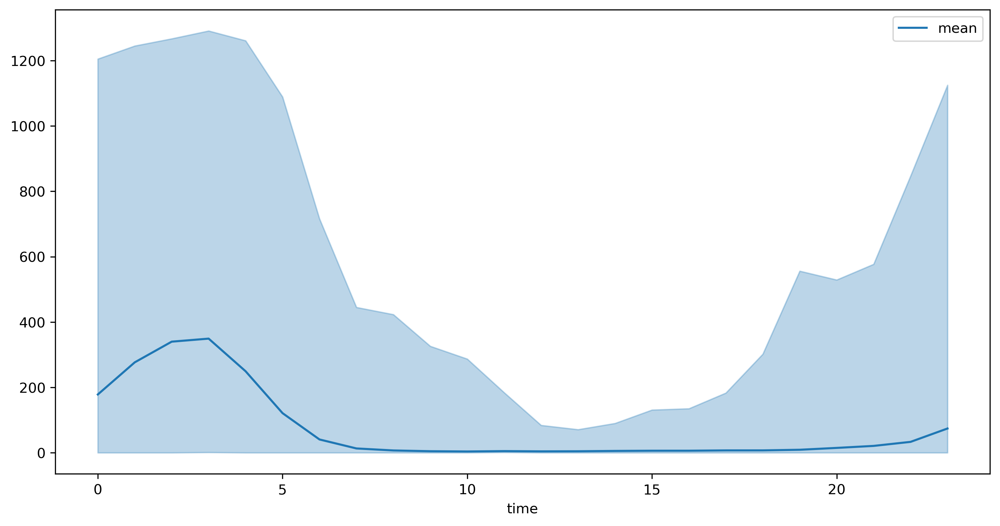

In [153]:
plt.rcParams['figure.figsize'] = [12, 6]
plt.rcParams['figure.dpi'] = 300
ax = stats_zero_frequency.plot(x='time', y='mean',color='tab:blue',)
ax.fill_between(x='time', y1='min', y2='max', data=stats_zero_frequency,
                color='tab:blue',alpha = 0.3)
plt.show()

### Plot  2 - heatplot

<Axes: xlabel='time', ylabel='siteId'>

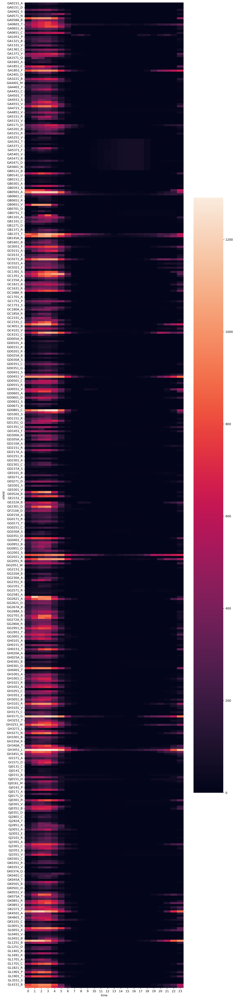

In [102]:
figure(figsize=(12, 60), dpi=300)
glue = zero_plot.pivot(index="siteId", columns="time", values="zero_frequency")
sns.heatmap(glue)

### Plot 3 - Interactive plot

In [76]:
import plotly.express as px

fig = px.line(zero_plot, x="time", y="zero_frequency", color='siteId')
fig.show()

## Plot functions

In [95]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

<Axes: xlabel='timeStamp', ylabel='flow'>

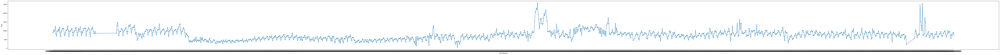

In [21]:
figure(figsize=(120, 6), dpi=300)
sns.lineplot(x='timeStamp', y='flow', data=agr_daily, marker='o')

In [20]:
import plotly.express as px
fig = px.line(agr_daily, 'timeStamp', 'flow',title='daily traffic flows')
fig.show()

## Implement on 470 data

In [139]:
data_470 = pd.read_csv('SCOOT/detector_470_19_23.csv')
detector_470 = data_470.siteId.tolist()

for detector in detector_470:
    
    site_df1 = pd.read_csv('../20211028_SCOOT_Data/JupyterNotebook_CSV/20211213_SCOOT_data/' + detector + '&2019_08_05-2021_12_12.csv')
    site_df2 = pd.read_csv('SCOOT/data/' + detector + '&2021_12_13-2023_09_30.csv')
    data = pd.concat([site_df1,site_df2]).reset_index(drop=True)
    
    data = recover_lastupdate(data)
    fullData = merge_allTime(data, allTime)
    agr_hour = aggregate_data(fullData,4,'2019-10-01')

    agr_hour.to_csv('SCOOT/data_470_hourly/' + detector + '.csv', index = False)
    
data_all = data_470[['siteId','lat','lon']]
data_all = data_all.rename(columns={'siteId': 'id', 'lat': 'latitude', 'lon': 'longitude'})
data_all.to_csv('SCOOT/data_470_hourly/locations.csv', index = False)

In [195]:
fig = px.line(agr_30, 'timeStamp', 'flow',title='15-min traffic flows')
fig.show()